In [101]:
import tqdm
import urllib
import requests
import pickle
import os, glob
import time
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
import shutil

# vk facesmash

In [2]:
tok = "2ae1b3d3aae47b6f27b06dc7e2efc2c8f2004b971ed4a398cee255ad5c11a69b1bab496cd0e56cfd8205c"

In [3]:
groups = [55059952, 24234717, 60289186, 60547224]

In [63]:
address = 'C:\\Users\\user\\Desktop\\philip\\5_WEB_Flask_Collector\\facesmash-master\\app\static\\img\\girls\\'
address_new = 'C:\\Users\\user\\Desktop\\philip\\5_WEB_Flask_Collector\\facesmash-master\\app\static\\img\\girls_with_faces'
address_new_new = 'C:\\Users\\user\\Desktop\\philip\\5_WEB_Flask_Collector\\facesmash-master\\app\static\\img\\new\\'
address_tmp = 'C:\\Users\\user\\Desktop\\philip\\5_WEB_Flask_Collector\\facesmash-master\\app\static\\img\\tmp\\'

In [17]:
def get_data(group, offset=0):
    time.sleep(1)
    response = requests.get('https://api.vk.com/method/{METHOD_NAME}'.format(METHOD_NAME='groups.getMembers'),
                                  params={'group_id': group, 
                                          'access_token': tok,
                                          'sort': 'id_asc',
                                          'offset': offset,
                                          'fields': 'sex, bdate, city, country, photo_400_orig, photo_max_orig, education, universities',
                                          'v': 5.59}).json()
    return response

users = []
for group in groups:
    response = get_data(group)
    users.extend(response['response']['items'])
    n =  response['response']['count'] // 1000 + 1
    for i in range(n):
        response = get_data(group, offset=(i+1)*1000)
        users.extend(response['response']['items'])

In [18]:
len(users)

9629

In [20]:
users[:1]

[{'id': 991,
  'first_name': 'Дмитрий',
  'last_name': 'Горнизов',
  'deactivated': 'banned',
  'sex': 2,
  'photo_400_orig': 'https://vk.com/images/deactivated_400.png',
  'photo_max_orig': 'https://vk.com/images/deactivated_400.png'}]

In [26]:
unique = list({ each['id'] : each for each in users }.values())

In [39]:
len(unique)

6087

In [37]:
girls = [ each for each in unique if each['sex']==1 ]

In [38]:
len(girls)

2483

In [47]:
girls[:2]

[{'id': 6619,
  'first_name': 'Даша',
  'last_name': 'Дейген',
  'sex': 1,
  'bdate': '15.11',
  'city': {'id': 1, 'title': 'Москва'},
  'country': {'id': 1, 'title': 'Россия'},
  'photo_400_orig': 'https://sun1-17.userapi.com/c840328/v840328218/41a4/rMsweOwIkHA.jpg?ava=1',
  'photo_max_orig': 'https://sun1-17.userapi.com/c840328/v840328218/41a4/rMsweOwIkHA.jpg?ava=1'},
 {'id': 8403,
  'first_name': 'Ида',
  'last_name': 'Павличенко',
  'sex': 1,
  'bdate': '8.6',
  'country': {'id': 9, 'title': 'США'},
  'photo_400_orig': 'https://sun9-22.userapi.com/c625422/v625422403/473bc/Ljyf4J51tAg.jpg?ava=1',
  'photo_max_orig': 'https://sun9-22.userapi.com/c625422/v625422403/473bc/Ljyf4J51tAg.jpg?ava=1'}]

In [52]:
for u in girls:
    if ( not u['photo_max_orig'] or u['photo_max_orig']=='https://vk.com/images/deactivated_400.png'):
        continue
    img_data = requests.get(u['photo_max_orig']).content
    with open(address+str(u['id'])+'.jpg', 'wb') as handler:
        handler.write(img_data)

In [53]:
u = [u for u in girls if u['id']==296455836][0]

In [54]:
u

{'id': 296455836,
 'first_name': 'Валерия',
 'last_name': 'Ратникова',
 'sex': 1,
 'bdate': '12.5.2002',
 'country': {'id': 1, 'title': 'Россия'},
 'photo_400_orig': 'https://vk.com/images/camera_400.png?ava=1',
 'photo_max_orig': 'https://vk.com/images/camera_400.png?ava=1',
 'university': 0,
 'university_name': '',
 'faculty': 0,
 'faculty_name': '',
 'graduation': 0,
 'universities': []}

In [56]:
for u in girls:
    if ( not u['photo_max_orig'] or u['photo_max_orig']=='https://vk.com/images/deactivated_400.png'):
        continue
    if u['photo_max_orig'] == 'https://vk.com/images/camera_400.png?ava=1':
        os.remove(address+str(u['id'])+'.jpg')

### Face Recognize

In [151]:
def get_images(path):
    # Ищем все фотографии и записываем их в image_paths
    #image_paths = [os.path.join(path, f) for f in os.listdir(path) if not f.endswith('.happy')]
    image_paths = [os.path.join(path, f) for f in os.listdir(path)]
    images = []
    images_orig = []
    labels = []

    #print(image_paths)
    for image_path in image_paths:
        # Переводим изображение в черно-белый формат и приводим его к формату массива
        gray = Image.open(image_path).convert('L')
        image = np.array(gray, 'uint8')
        images_orig.append(image)
        # Из каждого имени файла извлекаем номер человека, изображенного на фото
        subject_number = int(os.path.split(image_path)[1].split(".")[0])
        
        # Определяем области где есть лица
        faces = faceCascade.detectMultiScale(image, scaleFactor=1.03, minNeighbors=7, minSize=(25, 25))
        # Если лицо нашлось добавляем его в список images, а соответствующий ему номер в список labels
        print(faces)
        if faces == ():
            images.append(np.zeros((50,50), dtype='float'))
        for (x, y, w, h) in faces:
            images.append(image[y: y + h, x: x + w])
            labels.append(subject_number)
            # В окне показываем изображение
            #cv2.imshow("", image[y: y + h, x: x + w])
            #cv2.waitKey(50)
            shutil.copy2(image_path, address_new)
            break
    return images_orig, images, labels

In [152]:
# Для детектирования лиц используем каскады Хаара
cascadePath = "haarcascade_frontalface_default.xml"
faceCascade = cv2.CascadeClassifier(cascadePath)

# Для распознавания используем локальные бинарные шаблоны
#recognizer = cv2.createLBPHFaceRecognizer(1,8,8,8,123)

In [153]:
images_orig, images,labels = get_images(address)

[[123  27  48  48]]


C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:22: DeprecationWarning: elementwise == comparison failed; this will raise an error in the future.


[[48 66 31 31]]
[[314  83  58  58]
 [211 138  72  72]
 [153 218 105 105]]
[[42  8 91 91]]
[[258  12  93  93]
 [ 90 273  93  93]
 [284  83  32  32]]
[[174  87 117 117]]
[[190 175  69  69]]
[[200 299  84  84]]
[[118 194  38  38]]
()
[[204 319  38  38]
 [174 188 103 103]
 [115 232  30  30]
 [ 60 230  31  31]]
[[ 87 142 232 232]]
()
[[170 296  37  37]
 [150 259  32  32]]
[[182 233 127 127]]
()
[[76 69 46 46]]
()
[[218 202  29  29]
 [ 95  92  52  52]]
[[171  29  59  59]]
[[109 251  73  73]
 [212  71  71  71]]
()
[[ 77  56 116 116]]
[[281 431  77  77]]
()
[[109  64 108 108]
 [132 235  74  74]]
[[158  43 234 234]]
()
[[ 52 275  73  73]
 [277 246 114 114]]
[[137 308  91  91]
 [192 152  52  52]]
()
()
()
[[234 241 108 108]]
[[146 213  78  78]]
[[155  27 117 117]
 [162 195  95  95]
 [157 228 123 123]]
[[283 299  61  61]]
[[198  42  50  50]
 [209  85  27  27]]
[[170 168  82  82]]
[[231 343  54  54]]
[[206 132  55  55]
 [141 131  58  58]]
()
[[151  87  81  81]
 [101 134  65  65]]
[[ 28  25 258 258

 [136 133 146 146]]
[[248 294  93  93]
 [ 71 202 108 108]
 [166  75  62  62]]
[[272 154  50  50]
 [245 365  75  75]]
[[ 99 135 109 109]]
[[ 21  51 182 182]
 [263  43 128 128]]
()
[[ 78 105  69  69]
 [115  57 139 139]]
[[241 224  50  50]]
[[148 137 109 109]
 [163 114  74  74]]
[[124  99  86  86]]
[[163 109 183 183]]
()
[[194  86  79  79]
 [203 218  89  89]]
[[250 272  66  66]
 [ 78 386  95  95]
 [315 516  58  58]
 [342  60  53  53]
 [151 502  60  60]
 [252  54  58  58]
 [124 111  68  68]]
[[229  17  32  32]
 [143 206 122 122]]
[[ 85  88 128 128]]
()
[[207 238  52  52]]
[[ 43 152  83  83]]
()
[[30 32 39 39]]
()
()
[[120 101 155 155]
 [299 176  85  85]]
()
[[117 146 121 121]
 [ 74 343 141 141]]
[[ 19  99  67  67]
 [305 147  64  64]]
[[157 123  53  53]]
()
()
[[ 72 390  57  57]
 [103  88 100 100]]
()
[[ 98 308  53  53]
 [157 133  51  51]]
[[ 81 143 220 220]]
[[105 148  56  56]
 [343 532  30  30]]
()
[[133  68 136 136]]
[[183  24 196 196]
 [157  90  78  78]]
[[166 251  53  53]]
[[119  89 22

 [103 350  53  53]]
[[105  18 158 158]
 [ 52  60 206 206]]
[[ 72 113 245 245]]
[[ 77 125  35  35]
 [338 221  41  41]
 [115  88  58  58]
 [252  78  58  58]]
()
()
[[ 77 284  62  62]]
()
[[ 51  92 273 273]]
[[132 272 118 118]
 [114  71 163 163]]
()
[[189 153  60  60]
 [339  76  57  57]]
[[117  67 117 117]
 [141 286  87  87]]
[[238 161  95  95]]
()
()
[[202 219  67  67]]
[[ 91 105 236 236]]
[[337  16  51  51]
 [ 24 360  80  80]
 [ 14 387  87  87]
 [103  62 218 218]]
[[111  84 184 184]]
()
[[163  33  80  80]]
()
[[ 95 122 116 116]]
[[149  81 124 124]]
()
[[260 288  60  60]]
()
[[328 139  39  39]
 [117  55 166 166]]
()
[[ 68  17  50  50]
 [122  20  46  46]
 [127  38  42  42]]
[[ 34  71 288 288]]
()
()
()
()
[[ 87  28 248 248]]
()
[[134 264  53  53]]
[[ 48  48 102 102]]
[[220 270  50  50]
 [159 159  29  29]
 [148 303  89  89]]
[[238 246  72  72]
 [114  91  42  42]]
()
[[143 372  68  68]
 [193 122  46  46]
 [ 30  50  38  38]
 [144  74  46  46]
 [231 327  59  59]]
[[138  35  93  93]
 [235  53 

 [162  97  61  61]]
()
()
[[44 44 47 47]]
()
[[ 53 227  65  65]]
[[140  92 221 221]]
[[103  46 111 111]]
[[148  98  51  51]]
[[150  83  87  87]]
[[174  70  72  72]]
[[199  32  93  93]
 [253 188 132 132]
 [177  65  66  66]
 [240  40  88  88]]
[[164 101 117 117]
 [ 70 112 109 109]
 [310 329  54  54]
 [266  52  67  67]]
[[188 156  60  60]
 [275 229  65  65]]
[[204  80  60  60]]
()
()
[[146 126 127 127]]
[[ 85  25 147 147]
 [166  89 126 126]
 [278 158  82  82]]
[[341  98  57  57]
 [132 104 104 104]]
[[ 42  20  46  46]
 [103 141 197 197]]
[[322 136  54  54]]
[[105 204 159 159]]
[[219  84  59  59]]
[[111  33  59  59]]
[[ 67  87  53  53]
 [ 82 321  35  35]]
[[291 214  32  32]]
[[ 98 186 171 171]]
()
()
[[105 311  51  51]
 [139  83 129 129]]
[[190  12  52  52]
 [189  47  59  59]]
[[298  76  58  58]
 [126 104 137 137]]
[[249 162  46  46]]
[[189 103  28  28]]
[[103 194  33  33]]
()
[[ 23 171 112 112]]
[[289 289  56  56]
 [177 132  58  58]
 [109 131  62  62]
 [140 446  61  61]]
[[128 301  64  64]

In [146]:
len(images)

20

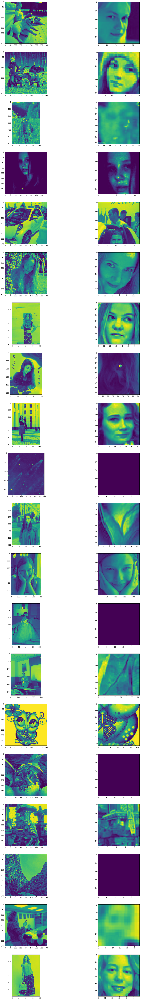

In [147]:
fig=plt.figure(figsize=(20, 120))
columns = 2
rows = len(images)
for i in range(1, columns*rows +1, 2):
    fig.add_subplot(rows, columns, i)
    plt.imshow(images_orig[(i-1)//2])
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(images[(i-1)//2])
plt.show()

### faces other

In [10]:
g1 = set(os.listdir(address))
g2 = set(os.listdir(address_new))
g = list(g1 - g2)

In [13]:
g[0]

'24466097.jpg'

In [18]:
ims = []
for i in range(30):
    image_path = address+g[i]
    gray = Image.open(image_path).convert('L')
    image = np.array(gray, 'uint8')
    ims.append(image)

C:\Users\user\Anaconda3\lib\site-packages\matplotlib\cbook\deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


IndexError: list index out of range

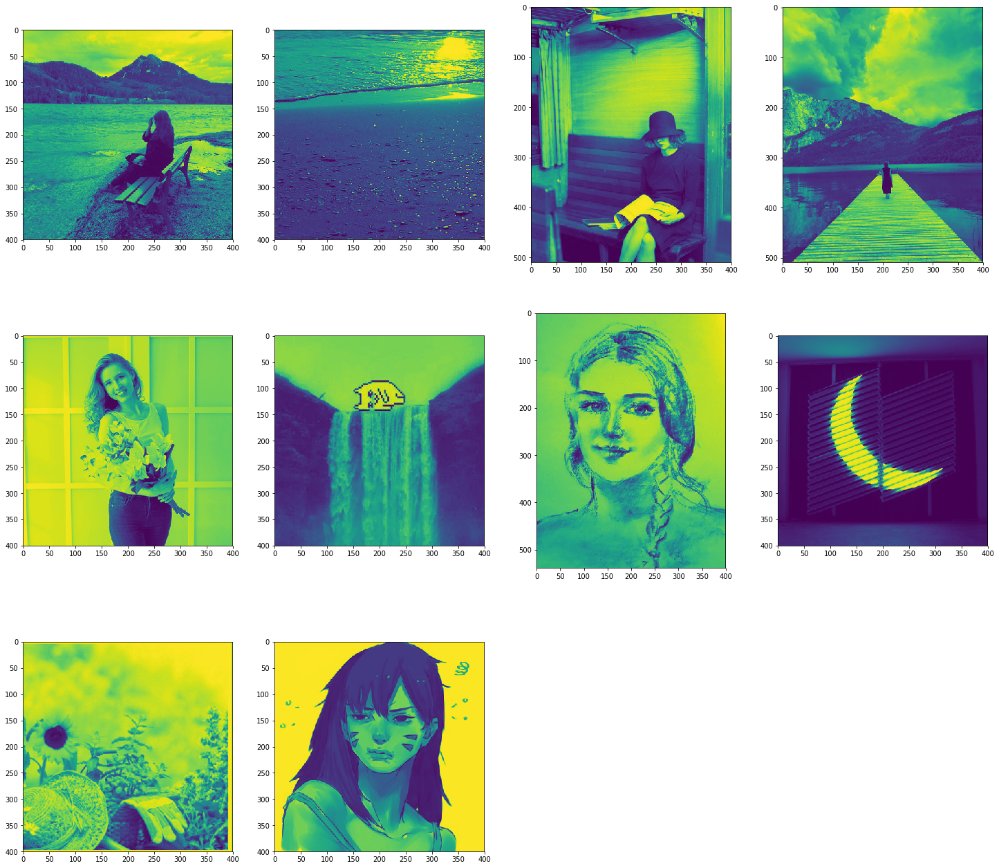

In [23]:
fig=plt.figure(figsize=(25, 80))
columns = 4
rows = 10
for i in range(1, rows +1):
    fig.add_subplot(rows, columns, i)
    plt.imshow(ims[(i-1)+3*(i-1)])
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(ims[(i-1)+3*(i-1) + 1])
    fig.add_subplot(rows, columns, i+2)
    plt.imshow(ims[(i-1)+3*(i-1) + 2])
    fig.add_subplot(rows, columns, i+3)
    plt.imshow(ims[(i-1)+3*(i-1) + 3])
plt.show()

### faces from vk, and recognition

In [66]:
# Для детектирования лиц используем каскады Хаара
cascadePath = "lbpcascade_frontalface_improved.xml"
faceCascade = cv2.CascadeClassifier(cascadePath)

# Для распознавания используем локальные бинарные шаблоны
#recognizer = cv2.createLBPHFaceRecognizer(1,8,8,8,123)

In [106]:
def get_images(gid):
    response = requests.get('https://api.vk.com/method/{METHOD_NAME}'.format(METHOD_NAME='photos.get'),
                              params={'owner_id': gid, 
                                      'access_token': tok,
                                      'album_id': 'profile',
                                      'offset': 0,
                                      'rev': 1,
                                      'count': 10,
                                      'v': 5.59}).json()
    files = os.listdir(address_tmp)
    for f in files:
        os.remove(address_tmp+f)
    try:
        images = [ r['photo_604'] for r in response['response']['items'] ]
        for i, u in enumerate(images):
            img_data = requests.get(u).content
            with open(address_tmp+str(i)+'.jpg', 'wb') as handler:
                handler.write(img_data)
    except KeyError:
        shutil.copy2(address+str(gid)+'.jpg', address_tmp)

In [131]:
def get_face(path, gid):
    # Ищем все фотографии и записываем их в image_paths
    #image_paths = [os.path.join(path, f) for f in os.listdir(path) if not f.endswith('.happy')]
    image_paths = [os.path.join(path, f) for f in os.listdir(path)]
    images = []
    wm, hm, whm = 0, 0, 0
    img_path_max = ''
    X = None

    for image_path in image_paths:
        # Переводим изображение в черно-белый формат и приводим его к формату массива
        gray = Image.open(image_path).convert('L')
        image = np.array(gray, 'uint8')

        # Из каждого имени файла извлекаем номер человека, изображенного на фото
        subject_number = int(os.path.split(image_path)[1].split(".")[0])
        
        # Определяем области где есть лица
        faces = faceCascade.detectMultiScale(image, scaleFactor=1.01, minNeighbors=7, minSize=(25, 25))
        # Если лицо нашлось добавляем его в список images, а соответствующий ему номер в список labels
        #print(image_path, faces)
        #if faces == ():
        #    images.append(np.zeros((50,50), dtype='float'))
        #if faces != ():
        for (x, y, w, h) in faces:
            if (w**2 + h**2)**0.5 >= whm:
                whm = (w**2 + h**2)**0.5
                X = (x, y, w, h)
                img_path_max = image_path
    if X:
        x, y, w, h = X
        #images.append(img_path_max[y: y + h, x: x + w])
        shutil.copy2(img_path_max, address_new_new+str(gid)+'.jpg')

In [ ]:
print(len(g))
for i, ig in enumerate(g[581:]):
    gid = int(ig.split('.')[0])
    print(i, gid)
    get_images(gid)
    get_face(address_tmp, gid)
    if i % 4 == 0:
        time.sleep(2)

792
0 425572912
1 78732555
2 403996237
3 410505523
4 207238145
5 400674942
6 505801107
7 121180474
8 535128073
9 179164772
10 245117398
11 452289526
12 272633111
13 181113102
14 60267610
15 139399153
16 217518059
17 111239948
18 17491731
19 271995370
20 429664737
21 488052236
22 264283043
23 62798884
24 20035630
25 346842411
26 95958255
27 236896995
28 45158671
29 431306287
30 112945038
31 199888637
32 382160101
33 365858842
34 478618657
35 22029468
36 537243873
37 406120704
38 442245592
39 235167499
40 271669270
41 313425523
42 12766325
43 71182468
44 472500389
45 57288964
46 169404656
47 176824632
48 19154325
49 334449874
50 22744493
51 290779940
52 463511975
53 7624009
54 214213060
55 211658389
56 2056074
57 502894064
58 1368988
59 219667420
60 478056216
61 914287
62 25639109
63 159848799
64 173129462
65 21783238
66 276597473
67 320471340
68 232702047
69 158443497
70 34955356
71 316379432
72 4790566
73 9852665
74 72516194
75 386003924
76 38573542
77 352932430
78 319318986
79 5004676

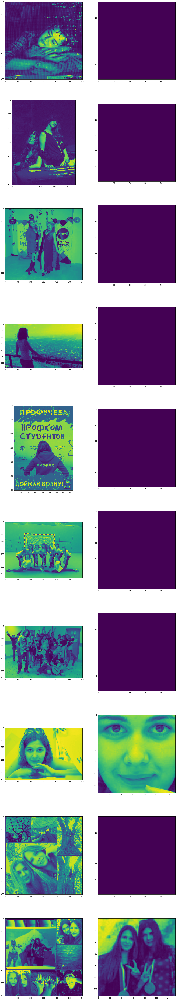

In [87]:
fig=plt.figure(figsize=(20, 120))
columns = 2
rows = len(images)
for i in range(1, columns*rows +1, 2):
    fig.add_subplot(rows, columns, i)
    plt.imshow(images_orig[(i-1)//2])
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(images[(i-1)//2])
plt.show()